# *Copyright*


- *Reference: "Nicholas Renotte" -  https://bit.ly/3mDJllD*
- <font color="lightblue">*Changes, inferences, side comments and aprroaches were carried out by Damadori on:*</font> *https://github.com/IA-DAMA*

# <font color="red">*Approached by Damadori*

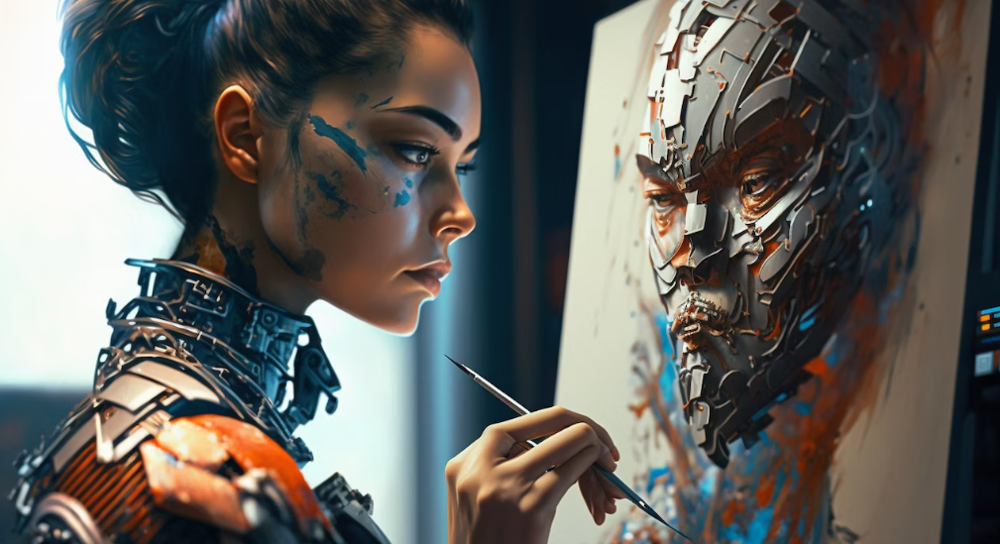

# *Image Classification*

*Image Classification is a fundamental task in vision recognition that aims to understand and categorize an image as a whole under a specific label. Unlike object detection, which involves classification and location of multiple objects within an image, image classification typically pertains to single-object images. When the classification becomes highly detailed or reaches instance-level, it is often referred to as image retrieval, which also involves finding similar images in a large database.* *By https://paperswithcode.com/task/image-classification.*

*For more: https://www.tensorflow.org/tutorials/images/classification*

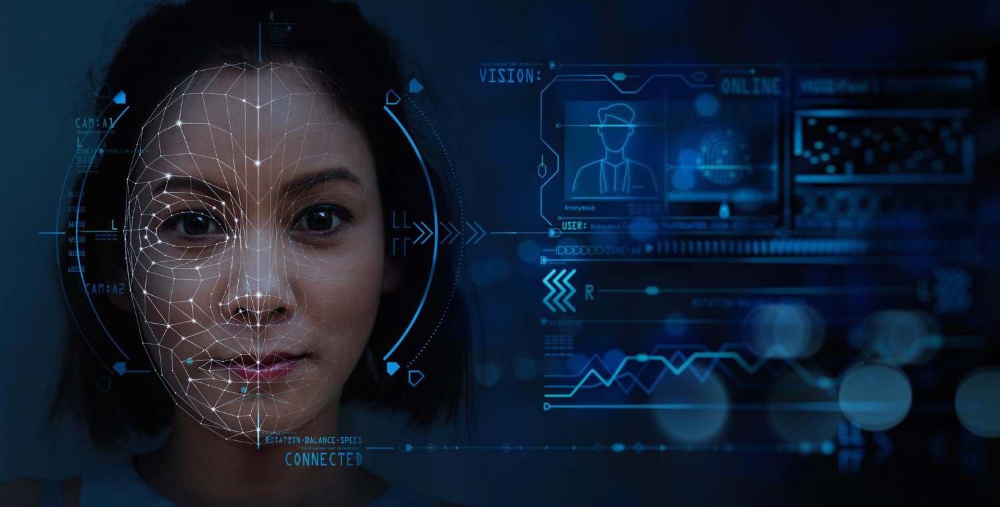

# *Part 1: Setup and Load Data*

# *1.1 Installing dependencies*

In [ ]:
!pip install tensorflow
!pip install opencv-python
!pip install matplotlib
!pip install numpy

  Using cached matplotlib-3.7.3-cp39-cp39-win_amd64.whl (7.5 MB)


*You might check all packs imported within the dependencies upwards*

In [ ]:
#!pip list

*Importing dependencies*

In [ ]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt

# *1.2 Managing GPU Memory Growth*

In [ ]:
# gpus = tf.config.experimental.list_physical_devices('GPU')

In [ ]:
# len(gpus)

In [ ]:
# gpus = tf.config.experimental.list_physical_devices('CPU')

In [ ]:
# gpus

In [ ]:
# AVoid OOM errors by setting GPU Memory Groth consumption

gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
  tf.config.experimental.set_memory_growth(gpu, True)

# *1.3 Remove questionable images*

*importing dependencies so we can do that*

In [ ]:
import cv2
import imghdr

# *1.4 Loading Data previously*

- *We will load it properly later*

In [ ]:
data_dir = 'D:\ImageOfFaces\data'  # The path to the dataset

In [ ]:
os.listdir(data_dir) # Listing subfolders

['Happy', 'Sad']

In [ ]:
image_exts = ['jpeg', 'jpg', 'bmp', 'png'] # Typo extensions

In [ ]:
image_exts[2] # 2 represents 'bmp', 1 represents 'png', so on

'bmp'

*Load an image from the specified path using OpenCV (cv2). The image is located in `'D:\ImageOfFaces\data'` within the `'Happy' folder`, named `'happy-people3.jpg'`.*

In [ ]:
cv2.imread(os.path.join('D:\ImageOfFaces\data', 'Happy', 'happy-people3.jpg' ))

array([[[ 21,  94,  68],
        [ 21,  94,  68],
        [ 20,  93,  67],
        ...,
        [164, 242, 235],
        [165, 243, 236],
        [165, 243, 236]],

       [[ 21,  94,  68],
        [ 21,  94,  68],
        [ 20,  93,  67],
        ...,
        [161, 241, 234],
        [161, 241, 234],
        [162, 242, 235]],

       [[ 21,  94,  68],
        [ 20,  93,  67],
        [ 19,  92,  66],
        ...,
        [159, 242, 234],
        [159, 242, 234],
        [159, 242, 234]],

       ...,

       [[114, 173, 142],
        [114, 173, 142],
        [113, 172, 141],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[109, 168, 137],
        [109, 168, 137],
        [109, 168, 137],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[106, 165, 134],
        [106, 165, 134],
        [106, 165, 134],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]]

*The loaded image will be stored in the variable `'img'`*

In [ ]:
img = cv2.imread(os.path.join('D:\ImageOfFaces\data', 'Happy', 'happy-people3.jpg' )) # Loading an image right straight from a dataset

In [ ]:
type(img) # Here we can notice its type

numpy.ndarray

In [ ]:
img.shape # Here we can notice its original shape

(377, 740, 3)

*Display the loaded image*

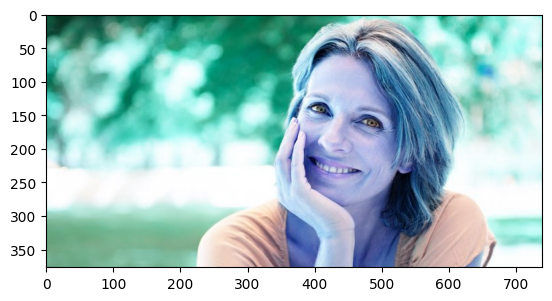

In [ ]:
plt.imshow(img) # Plotting BGR

*Display the loaded image using Matplotlib and convert it to RGB format.*

- *'img' contains the image loaded with OpenCV in BGR format, so we use cv2.COLOR_BGR2RGB to convert it to RGB.*

- *Then, we use plt.imshow() to show the image, and plt.show() to display it.*

<function matplotlib.pyplot.show(close=None, block=None)>

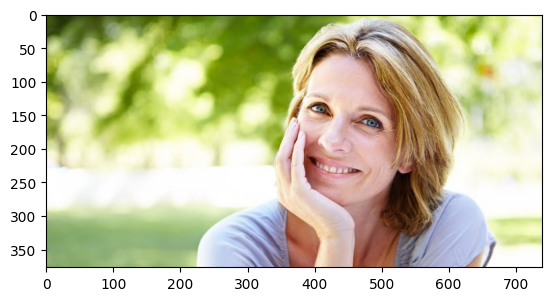

In [ ]:
# Plotting original image "Convertion"
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show

In [ ]:
# Listing both datasets
for image_class in os.listdir(data_dir):
    print(image_class)

Happy
Sad


*This commented-out code's part of a nested loop that iterates through the subdirectories of data_dir and the images within those subdirectories. Specifically:*

- *The outer loop `(for image_class in os.listdir(data_dir))` iterates through the subdirectories within the data_dir directory. Each image_class variable likely represents a different category or class of images.*

- *The inner loop `(for image in os.listdir(os.path.join(data_dir, image_class)))` iterates through the files within each image_class subdirectory. The `os.path.join()` function constructs the full path to each image file.*

- *For each image file, the code prints the name of the image using `print(image)`.*

In [ ]:
#for image_class in os.listdir(data_dir):
#    for image in os.listdir(os.path.join(data_dir, image_class)):
#        print(image)

*This loop is designed to filter out images with invalid or unexpected file formats from the specified directory. If you uncomment the line os.remove(image_path), it will also delete problematic images from the directory. However, be cautious when using this code, as it permanently deletes files.*

In [ ]:
for image_class in os.listdir(data_dir):
    for image_filename in os.listdir(os.path.join(data_dir, image_class)):
        try:
            image_path = os.path.join(data_dir, image_class, image_filename)
            img = cv2.imread(image_path)
            tip = imghdr.what(image_path)
            if tip not in image_exts:
                print('Image not in ext list {}'.format(image_path))
                os.remove(image_path)
        except Exception as e:
            print('Issue with image {}'.format(image_path))
            # os.remove(image_path)  # Uncomment this line if you want to remove problematic images

# *Part 2: Load Data*

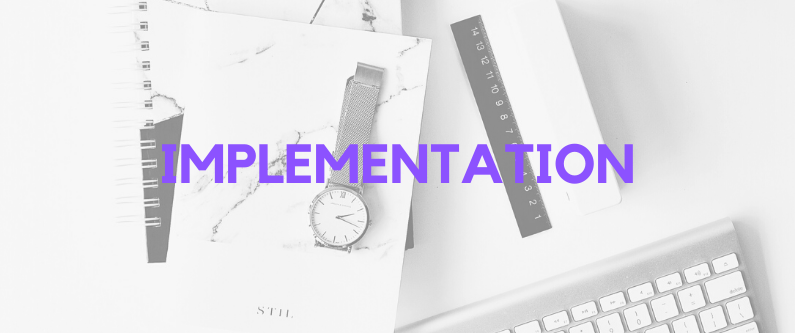

*Accessing the source code or documentation for tf.data.Dataset using `tf.data.Dataset??`*

<font color="red">*tf.data.Dataset`*</font> *in TensorFlow is used for efficient data loading, transformation, and batching, making it easier to prepare and process large datasets for machine learning and deep learning tasks.*

In [ ]:
#tf.data.Dataset?? #Docmentation - Preprocessing lib

<font color="red">*tf.keras.utils.image_dataset_from_directory:*</font> *A TensorFlow Keras function for effortlessly generating datasets from image files organized in directories. Ideal for image classification tasks, it automates data loading, preprocessing, shuffling, and batching, streamlining the preparation of data for training deep learning models, particularly in computer vision applications.*

In [ ]:
#tf.keras.utils.image_dataset_from_directory?? # Features of preprocessing

*Create a dataset from image files in a directory*


In [ ]:
data = tf.keras.utils.image_dataset_from_directory('D:\ImageOfFaces\data')

Found 176 files belonging to 2 classes.


*Description of the dataset's structure.*

In [ ]:
data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

*This line converts 'data' into a NumPy iterator, allowing us to loop through it.*

In [ ]:
data_iterator = data.as_numpy_iterator()

In [ ]:
data_iterator

*Here, we advance 'data_iterator' to the next batch of data and assign it to 'batch'.*

In [ ]:
# Get another batch from iterator
batch = data_iterator.next()

In [ ]:
# batch # Batches of data

*This line shows the shape of batch[0], which is (32, 256, 256, 3). It indicates that batch[0] is a 4-dimensional NumPy array with a shape of (32, 256, 256, 3). This suggests that it's a batch of 32 images, each with dimensions 256x256 pixels, and 3 color channels (RGB).*

In [ ]:
batch[0].shape

(32, 256, 256, 3)

*It's an array of binary values, possibly representing labels or some other binary classification output. The values in the array appear to be [1, 0, 1, 0, 1, 1, 0, 0, ...], indicating a binary classification where each element corresponds to a sample's class label (1 for one class, 0 for another)*

In [ ]:
batch[1]

array([1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 1])

*This visualization allows you to examine a subset of your image data and their associated labels, making it easier to understand and verify the data before or during an image classification task. It provides a quick and informative overview of the dataset's content and label distribution.*

# *2.1 Visualizing First Four Images with Labels*

*This code segment creates a grid of four subplots to display the first four images from 'batch[0]' alongside their corresponding labels from 'batch[1]'. It offers a visual insight into the dataset, helping us examine the image data and associated labels for analysis and verification."*

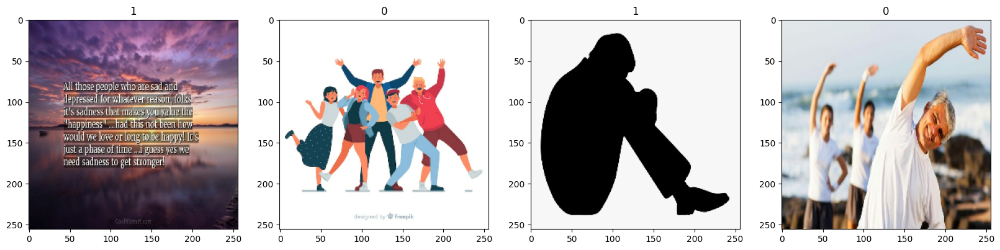

In [ ]:
fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx, img in enumerate(batch[0][:4]):
    ax[idx].imshow(img.astype(int))
    ax[idx].title.set_text(batch[1][idx])

*As we can notice above from a very simple example, class 1 plots "sad" and class 0 plots "happy" just as it's structured to be*

# *Part 3: Scale Data*

# *3.1 Preprocess*

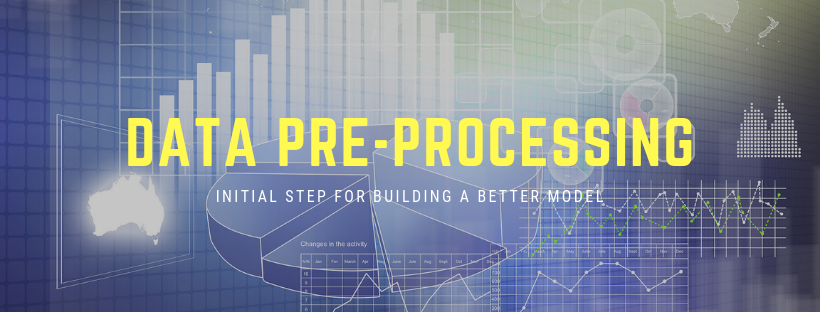

*The line 'batch[0]' is used to access image data from the 'batch' variable. It's a key step in retrieving and displaying images within the code, enabling visual examination and analysis of the dataset's image content.*

In [ ]:
# batch[0]

# *3.2 Extracting Data Range Information*

*These values provide insight into the data range, which can be useful for understanding the dataset's statistical characteristics, especially in scenarios like data preprocessing or scaling for machine learning tasks."*

In [ ]:
batch[0].min()

0.0

In [ ]:
batch[1].max()

1

*'batch[0]' is being scaled by dividing it by 255. This operation is often used to normalize pixel values in images, assuming they are in the range [0, 255]. After scaling, it computes and displays the minimum and maximum values in the scaled data ('scaled'). This information helps ensure that the image data is appropriately scaled and within a desirable numerical range, typically [0, 1] after division by 255.*

In [ ]:
scaled = batch[0] / 255

In [ ]:
scaled.min()

0.0

In [ ]:
scaled.max()

1.0

# *3.3 Scaling and Preprocessing Image Data*

- *In this code block, the 'data' is mapped using a lambda function to scale the image data `('x')` by dividing it by 255, while preserving the labels `('y')`. This scaling is a common preprocessing step for images with pixel values in the range `[0, 255]`.*

- *Then creates a 'scaled_iterator' to iterate through the scaled data. It retrieves the maximum value from the first batch of scaled data `('scaled_iterator.next()[0].max()')`, which can provide insight into the data's numerical range after scaling. Finally, `'batch'` is assigned to the next batch of data from the `'scaled_iterator,'` potentially for further processing or analysis.*

In [ ]:
data = data.map(lambda x, y: (x/255, y))

In [ ]:
scaled_iterator = data.as_numpy_iterator()

In [ ]:
scaled_iterator.next()[0].max()

1.0

In [ ]:
batch = scaled_iterator.next()

# *3.4 Visualizing Scaled Images with Labels*

*We're going to create a grid of four subplots using 'plt.subplots' to display a subset of scaled images from `'batch[0]'` alongside their corresponding labels from `'batch[1]'`. The images have likely been previously scaled `(e.g., to a range of [0, 1])`n, making them suitable for visualization.*


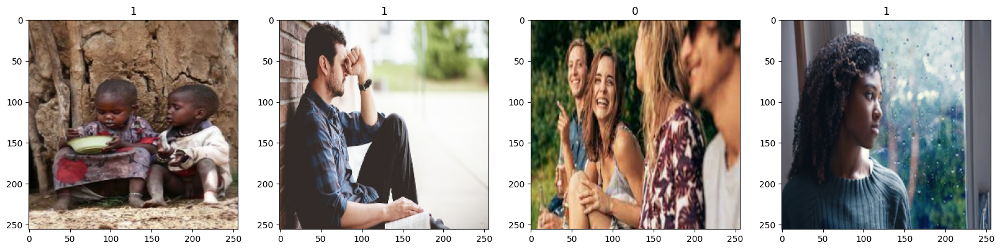

In [ ]:
fig, ax = plt.subplots(ncols=4, figsize=(20,20))
for idx, img in enumerate(batch[0][:4]):
    ax[idx].imshow(img)
    ax[idx].title.set_text(batch[1][idx])

# *Part 4: Split Data*

# *Determining Dataset Length*



*Calculate the length or the number of samples in the 'data' dataset. This information is valuable for understanding the dataset's size and is often used for tasks like setting batch sizes, iterating through the dataset, or evaluating data distribution.*

In [ ]:
len(data)

6

# *4.1 Splitting Dataset into Train, Validation, and Test Sets*






*It is responsible for splitting the 'data' dataset into three subsets: 'train,' 'validation,' and 'test.' It calculates the sizes for each subset based on percentages of the total dataset size and utilizes the 'take' and 'skip' methods to create these partitions.*

In [ ]:
total_size = len(data)
train_size = int(total_size * 0.6)
val_size = int(total_size * 0.2) + 1
test_size = total_size - train_size - val_size + 1

In [ ]:
train = data.take(train_size)
val = data.skip(train_size).take(val_size)
test = data.skip(train_size + val_size).take(test_size)

*In this section, you are assessing the sizes of the 'train,' 'validation,' and 'test' subsets, as well as printing their lengths*

- *`'len(test)'` calculates and displays the length of the 'test' subset.*

- *`'test_size'` holds the calculated size of the 'test' subset, which is based on the initial dataset splitting.*

- *`'len(train)'` calculates the length of the 'train' subset.*
- *`'len(val)'` calculates the length of the 'validation' subset.*

*Finally, the 'print' statement displays the lengths of 'train,' 'validation,' and 'test.' This is useful for verifying that the dataset has been split as intended, and the sizes of the subsets align with your expectations*







In [ ]:
len(test)

1

In [ ]:
test_size

2

In [ ]:
print(len(train), len(val), len(test))

3 2 1


# *Part 5: Deep Model*

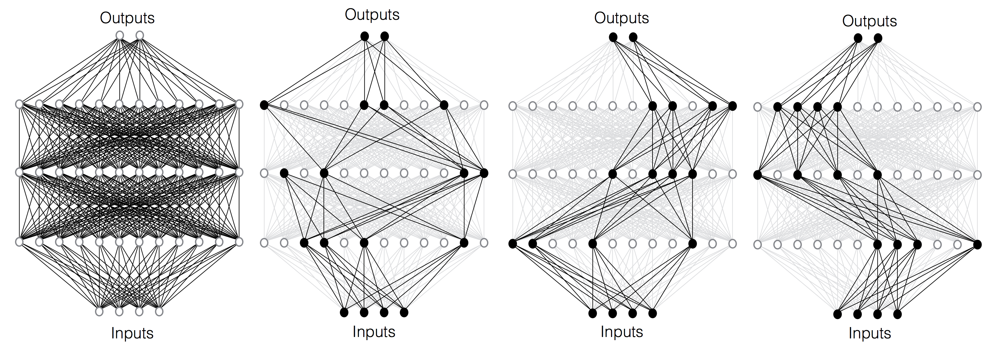

*Importing required applications and functions*

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout
from tensorflow.keras.layers.experimental.preprocessing import Rescaling

# *5.1 Defining a Convolutional Neural Network (CNN) Model*

In [ ]:
model = Sequential()

- *The first block starts with a convolutional layer with `16 filters of size (3, 3)`, using the ReLU activation function. It takes input images of size `(256, 256, 3)`. After the convolutional layer, a max-pooling layer reduces spatial dimensions.*

- *The second block introduces another convolutional layer with `32 filters` and a `ReLU activation`, followed by `max-pooling`.*

- *The third block has a convolutional layer with `16 filters and ReLU activation`, followed by `max-pooling`.*

- *The Flatten() layer flattens the output from the previous convolutional layers into a `1D vector`.*

- *Two fully connected (dense) layers follow. The first has `256 units with ReLU activation`, and the final output layer has a `single neuron with sigmoid activation`, which is typical for `binary classification` tasks.*

*Depending on the problem, you can adjust the architecture, such as the number of layers, filters, and units, to fit your specific requirements.*

In [ ]:
model.add(Conv2D(16, (3, 3), 1, activation='relu', input_shape=(256, 256, 3)))
model.add(MaxPooling2D())

model.add(Conv2D(32, (3, 3), 1, activation='relu'))
model.add(MaxPooling2D())

model.add(Conv2D(16, (3, 3), 1, activation='relu'))
model.add(MaxPooling2D())

model.add(Flatten())

model.add(Dense(256, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

*Copiling prepares the model for training by specifying how it should optimize its weights and how it should measure its performance. Once compiled, the model can be trained using a dataset to learn from the data and make predictions.*

In [ ]:
model.compile('adam', loss=tf.losses.BinaryCrossentropy(), metrics=['accuracy'])

# *5.2 Model Summary*

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 254, 254, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 127, 127, 16)     0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 125, 125, 32)      4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 62, 62, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 60, 60, 16)        4624      
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 30, 30, 16)      

# *Part 6: Training*

# *6.1 Logging Directory Configuration*

*`'logdir'` is defined as `'logs,'` serving as the directory where various training and performance-related logs will be stored. This directory is crucial for organizing and storing data that will be visualized and analyzed using TensorBoard. It provides a structured location for storing log files, making it easier to monitor and evaluate the neural network's training process and performance metrics*

In [ ]:
logdir='logs'

*During model training, this callback will automatically record and store various training metrics, making it possible to visualize and analyze the neural network's performance using the TensorBoard web interface.*

In [ ]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)

# *6.2 Model Training with TensorBoard Logging*

*During training, various performance metrics and statistics are collected and logged by the 'TensorBoard Callback.' These logs include training loss, accuracy, validation loss, and validation accuracy, among others. By training the model with this callback, you enable the seamless integration of TensorBoard, which will allow you to visualize and analyze the model's training progress and performance in real-time or post-training.*

In [ ]:
history = model.fit(train, epochs=20, validation_data=val, callbacks=[tensorboard_callback])

Epoch 1/20
3/3 [==============================] - 26s 7s/step - loss: 1.1771 - accuracy: 0.4792 - val_loss: 0.8065 - val_accuracy: 0.4219
Epoch 2/20
3/3 [==============================] - 22s 8s/step - loss: 0.6798 - accuracy: 0.5729 - val_loss: 0.6631 - val_accuracy: 0.5469
Epoch 3/20
3/3 [==============================] - 21s 6s/step - loss: 0.6126 - accuracy: 0.6042 - val_loss: 0.6451 - val_accuracy: 0.5625
Epoch 4/20
3/3 [==============================] - 27s 7s/step - loss: 0.6319 - accuracy: 0.5729 - val_loss: 0.5871 - val_accuracy: 0.6719
Epoch 5/20
3/3 [==============================] - 23s 7s/step - loss: 0.5846 - accuracy: 0.6562 - val_loss: 0.5523 - val_accuracy: 0.6250
Epoch 6/20
3/3 [==============================] - 24s 6s/step - loss: 0.5230 - accuracy: 0.7083 - val_loss: 0.4942 - val_accuracy: 0.8281
Epoch 7/20
3/3 [==============================] - 27s 7s/step - loss: 0.4843 - accuracy: 0.8438 - val_loss: 0.4062 - val_accuracy: 0.7344
Epoch 8/20
3/3 [==================

In [ ]:
#history.history

# *6.3 Visualizing Training and Validation Loss*

*This visualization is essential for understanding how well the model is learning during training and whether it is overfitting or underfitting.*

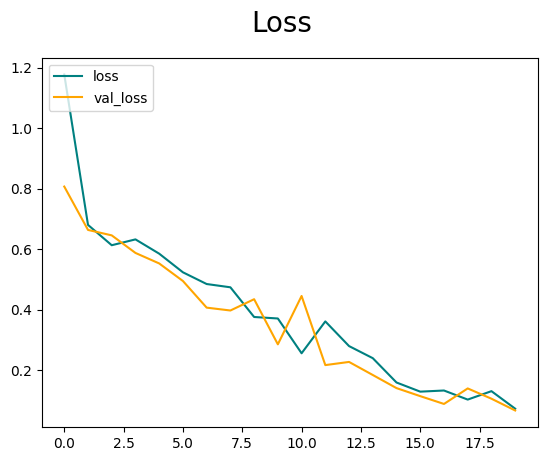

In [ ]:
fig = plt.figure()
plt.plot(history.history['loss'], color='teal', label='loss')
plt.plot(history.history['val_loss'], color='orange', label='val_loss')
fig.suptitle('Loss', fontsize=20)
plt.legend(loc="upper left")
plt.show()

# *6.4 Visualizing Training and Validation Accuracy*

*Monitoring these accuracy curves helps assess how well the model is learning and whether it's overfitting or generalizing effectively during training.*

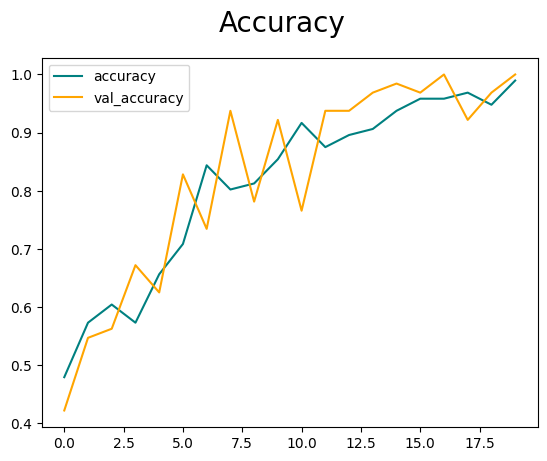

In [ ]:
fig = plt.figure()
plt.plot(history.history['accuracy'], color='teal', label='accuracy')
plt.plot(history.history['val_accuracy'], color='orange', label='val_accuracy')
fig.suptitle('Accuracy', fontsize=20)
plt.legend(loc="upper left")
plt.show()

# *6.5 Model Evaluation*

- *Importing Metrics*

In [ ]:
from tensorflow.keras.metrics import Precision, Recall, BinaryAccuracy

* *Initializing Precision and Recall Metrics / Initializing Binary Accuracy Metric*

In [ ]:
pre = Precision()
re = Recall()
acc = BinaryAccuracy()

In [ ]:
len(test)

1

- *Looping Through Test Data / Extracting Data and Making Predictions*

In [ ]:
for batch in test.as_numpy_iterator():
    X, y = batch
    yhat = model.predict(X)
    pre.update_state(y, yhat)
    re.update_state(y, yhat)
    acc.update_state(y, yhat)

1/1 [==============================] - 0s 347ms/step


- *Calculate precision, recall, and accuracy metrics that were previously computed during the evaluation of your model*

In [ ]:
print(f'Precision{pre.result().numpy()}, Recall:{re.result().numpy()}, Accuracy:{acc.result().numpy()}')

Precision1.0, Recall:1.0, Accuracy:1.0


# *Part 7: Test*

# *7.1 Loading image random samples for prediction*


- *Loading and Displaying an Image*

In [ ]:
import cv2 # Assure you've imported cv2

*Display the image using plt.imshow and plt.show. However, OpenCV reads images in BGR color format, so the colors may appear distorted when displayed this way.*

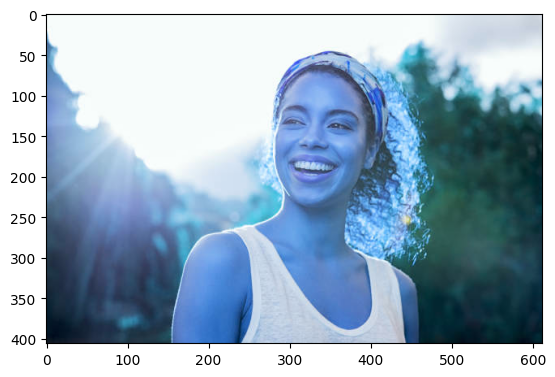

In [ ]:
img = cv2.imread(r'D:\ImageOfFaces\happy_sample.jpg')
plt.imshow(img)
plt.show()

- *Loading and Displaying the Same Image in RGB Format*

*To correct the color representation, it's converted from BGR to RGB format using `cv2.cvtColor`. Then, the RGB image is displayed using `plt.imshow` and `plt.show`.*

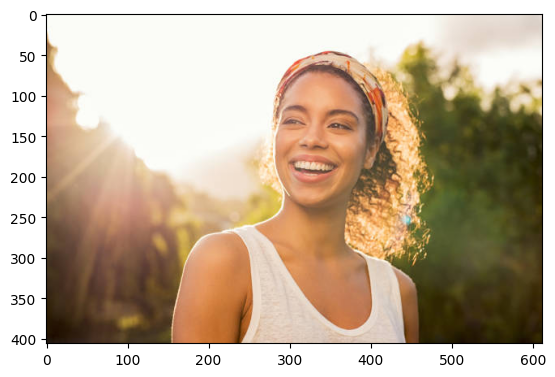

In [ ]:
img = cv2.imread(r'D:\ImageOfFaces\happy_sample.jpg')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

- *Resizing and Displaying the Image*

*The resized image is then displayed using `plt.imshow` and `plt.show`. Before displaying, it's converted to an integer format using `.astype(int)`.*

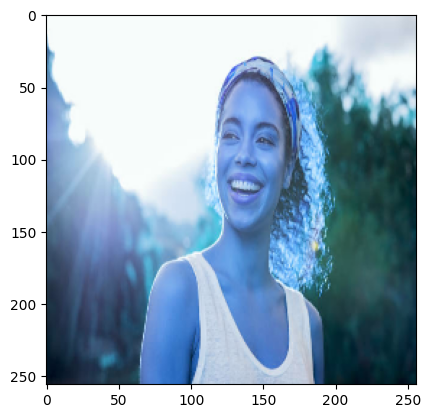

In [ ]:
resize = tf.image.resize(img,(256,256))
plt.imshow(resize.numpy().astype(int))
plt.show()

<font color="red">*Resizing the Image:*</font> *We'll resize the image and prints its shape. The result suggests that the resized image has dimensions of (256, 256, 3), meaning it has a height and width of 256 pixels and 3 color channels (likely representing RGB)*

In [ ]:
# resize

In [ ]:
resize.shape

TensorShape([256, 256, 3])

<font color="red">*Expanding Dimensions:*</font> *Here, we are expanding the dimensions of the resized image using `np.expand_dims`.*

In [ ]:
np.expand_dims(resize, 0).shape

(1, 256, 256, 3)

# *7.2 Making Predictions*

- *In this part, you use the model to make predictions on the resized image. Before feeding it to the model, you divide the pixel values by 255 to ensure they are in the `[0, 1]` range, which is a common preprocessing step for images.*

- *The result indicates that the model predicts a single value: `array([[0.4713186]], dtype=float32)`. This appears to be the model's prediction for this particular image, and it is a floating-point number.*



In [ ]:
yhat = model.predict(np.expand_dims(resize/255, 0))

1/1 [==============================] - 0s 220ms/step


In [ ]:
yhat

array([[0.4713186]], dtype=float32)

*Here, we essentially provide a simple classification result based on the model's prediction threshold, with "Sad" or "Happy" being the predicted classes depending on whether the predicted value is above or below 0.5, respectively.*

In [ ]:
if yhat > 0.5:
    print(f'Predicted class is Sad')
else:
    print(f'Predicted class is Happy')

Predicted class is Happy


- *Loading and Displaying an Image*

*Display the image using plt.imshow and plt.show. However, OpenCV reads images in BGR color format, so the colors may appear distorted when displayed this way.*

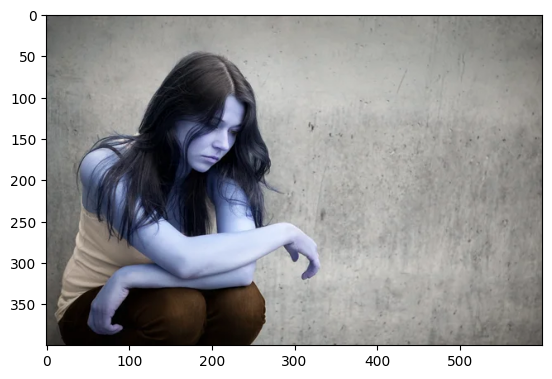

In [ ]:
img = cv2.imread(r'D:\ImageOfFaces\sad_sample.jpg')
plt.imshow(img)
plt.show()

- *Loading and Displaying the Same Image in RGB Format*

*To correct the color representation, it's converted from BGR to RGB format using `cv2.cvtColor`. Then, the RGB image is displayed using `plt.imshow` and `plt.show`.*

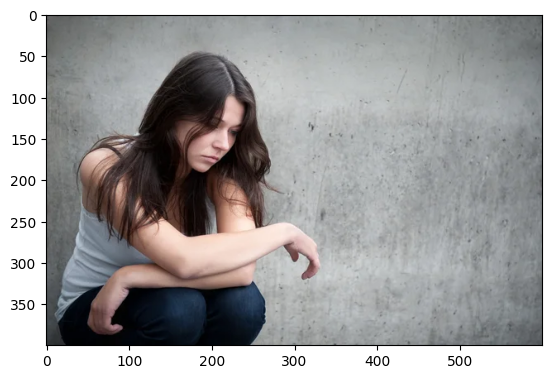

In [ ]:
img = cv2.imread(r'D:\ImageOfFaces\sad_sample.jpg')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

- *Resizing and Displaying the Image*

*The resized image is then displayed using `plt.imshow` and `plt.show`. Before displaying, it's converted to an integer format using `.astype(int)`.*

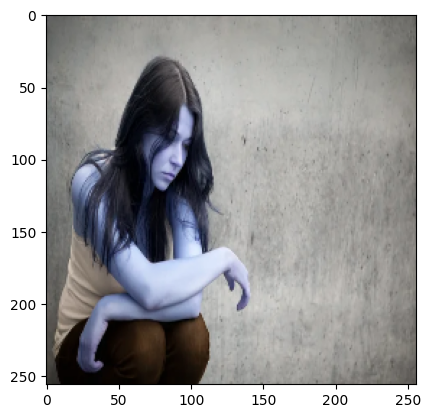

In [ ]:
resize = tf.image.resize(img,(256,256))
plt.imshow(resize.numpy().astype(int))
plt.show()

In [ ]:
resize.shape

TensorShape([256, 256, 3])

In [ ]:
np.expand_dims(resize, 0).shape

(1, 256, 256, 3)

In [ ]:
yhat = model.predict(np.expand_dims(resize/255, 0))

1/1 [==============================] - 0s 243ms/step


In [ ]:
yhat

array([[0.59767914]], dtype=float32)

In [ ]:
if yhat > 0.5:
    print(f'Predicted class is Sad')
else:
    print(f'Predicted class is Happy')

Predicted class is Sad


# *Save the Model*

In [ ]:
from tensorflow.keras.models import load_model

*Saving a Keras Model*

- *The model will be stored as an HDF5 file, which is a common format for saving Keras models*

In [ ]:
model.save(os.path.join('models', 'happynsad_model.h5'))

*Defining the Model File Path*
- *Here, you are using `os.path.join` to create a file path string for the saved model*

In [ ]:
os.path.join('models','happynsad_model.h5')

'models\\happynsad_model.h5'

*Loading a Keras Model*

- *We'll use the load_model function to load a previously saved Keras model from the file path `'models\happynsad_model.h5'`. The loaded model is then assigned to the variable `new_model`.*

In [ ]:
new_model = load_model(os.path.join('models','happynsad_model.h5'))

In [ ]:
new_model

*The output above indicates that the new_model variable now holds the loaded Keras Sequential model. The memory address `(0x2ba82792fa0)` is a representation of where the model is stored in memory.*

- *Before making predictions, the input image `(resize)` is preprocessed. It is scaled by dividing by 255 to bring the pixel values into the `[0, 1]` range (common for image data). Then, `np.expand_dims(..., 0)` is used to add an extra dimension to the input. This is typically done to create a batch dimension because Keras models often expect input data in batch form, even if it's a single image.*


- *The result of this code is the prediction made by `new_model` for the preprocessed image. It's likely a numerical value or an array of numerical values that represent the model's prediction for the given input image.*

In [ ]:
new_model.predict(np.expand_dims(resize/255, 0))

1/1 [==============================] - 1s 829ms/step


array([[0.59767914]], dtype=float32)

*We're going to assign the result of making predictions with our `new_model` to the variable `yhatnew`.*


- <font color="red">*new_model.predict(...):*</font> *This line uses the predict method of the new_model to make predictions.*

- <font color="red">*np.expand_dims(resize/255, 0):*</font> *Before making predictions, the input image `(resize)` is preprocessed. It is scaled by dividing by 255 to bring the pixel values into the `[0, 1]` range, which is a common preprocessing step for image data. Additionally, `np.expand_dims(..., 0)` is used to add an extra dimension to the input, effectively creating a batch of one image. Keras models often expect input data in batch form, even if it's a single image.*

- <font color="red">*yhatnew:*</font> *This variable stores the result of the prediction made by new_model. It will contain numerical values or an array of numerical values that represent the model's prediction for the given preprocessed input image.*


In [ ]:
yhatnew = new_model.predict(np.expand_dims(resize/255, 0))

1/1 [==============================] - 0s 211ms/step


*Simple classification result based on the model's prediction threshold, with <font color="gold">"Sad" or "Happy"</font> just as previously printed beefore saving the model*

In [ ]:
if yhat > 0.5:
    print(f'Predicted class is Sad')
else:
    print(f'Predicted class is Happy')

Predicted class is Sad


# <font color="red">*Summary*</font>

*We've covered various aspects of machine learning, data analysis, and model development, along with the use of Python libraries such as TensorFlow, Keras, NumPy, and Matplotlib.*

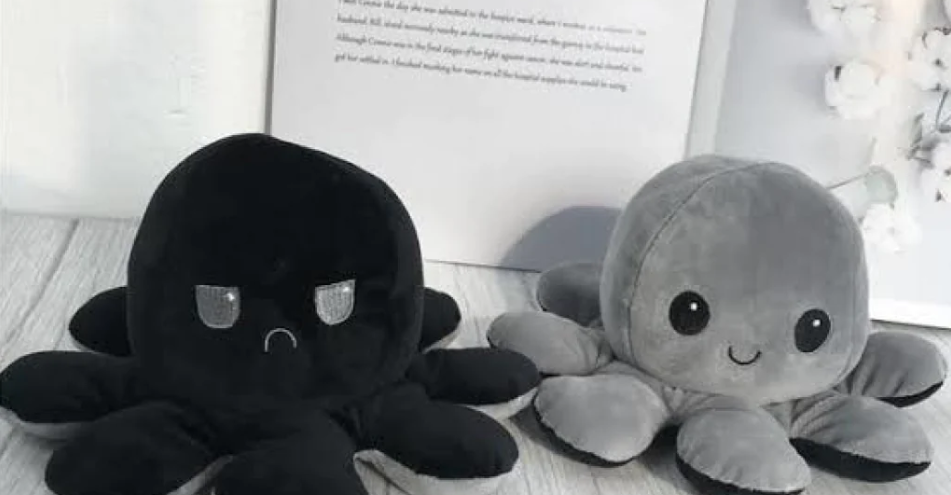

# *Overview of Image Classification approached*


<font color="red">*Data Preprocessing:*</font>

- *Loading and manipulating datasets for machine learning.
Resizing and preprocessing images for model input.*

- *Scaling pixel values to a standardized range (e.g., [0, 1]).*

<font color="red">*Model Development:*</font>

- *Defining and compiling a Convolutional Neural Network (CNN) model using Keras.
Configuring the model's architecture, loss function, optimizer, and evaluation metrics.*

<font color="red">*Training and Evaluation:*</font>

- *Splitting datasets into training, validation, and test sets for model training and evaluation.*
- *Training a model over multiple epochs and monitoring loss and accuracy.*
- *Visualizing training and validation performance using Matplotlib.*


<font color="red">*Inference and Prediction:*</font>

- *Using trained models to make predictions on new data.*
- *Interpreting model predictions based on predefined thresholds.*


<font color="red">*Model Saving and Loading:*</font>

- *Saving trained models to disk for future use.*
- *Loading saved models for inference or further training.*


<font color="red">*TensorBoard Integration:*</font>

- *Setting up TensorBoard for real-time visualization and analysis of training metrics.*
- *Logging training progress and performance for deep learning models.*

*Throughout, the code snippets and explanations were provided to illustrate these concepts. The topics covered here serve as foundational knowledge for individuals working on machine learning projects, from data preprocessing to model training, evaluation, and deployment.*